In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from pandas_profiling import ProfileReport

In [2]:
df=pd.read_csv('winequality_red.csv')

In [3]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [5]:
ProfileReport(df)

In [6]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [7]:
X=df.drop(columns='quality')

In [8]:
X

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [9]:
y=df.quality

In [10]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [11]:
X_train, X_test, y_train, y_test=train_test_split(X,y, test_size=.25, random_state=30)

In [12]:
X_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1178,5.6,0.915,0.00,2.1,0.041,17.0,78.0,0.99346,3.68,0.73,11.4
1189,8.8,0.955,0.05,1.8,0.075,5.0,19.0,0.99616,3.30,0.44,9.6
161,7.6,0.680,0.02,1.3,0.072,9.0,20.0,0.99650,3.17,1.08,9.2
109,8.1,0.785,0.52,2.0,0.122,37.0,153.0,0.99690,3.21,0.69,9.3
961,7.1,0.560,0.14,1.6,0.078,7.0,18.0,0.99592,3.27,0.62,9.3
...,...,...,...,...,...,...,...,...,...,...,...
919,8.4,0.620,0.12,1.8,0.072,38.0,46.0,0.99504,3.38,0.89,11.8
1164,9.0,0.785,0.24,1.7,0.078,10.0,21.0,0.99692,3.29,0.67,10.0
500,7.8,0.520,0.25,1.9,0.081,14.0,38.0,0.99840,3.43,0.65,9.0
941,9.9,0.270,0.49,5.0,0.082,9.0,17.0,0.99484,3.19,0.52,12.5


In [13]:
X_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1147,10.0,0.410,0.45,6.20,0.071,6.0,14.0,0.99702,3.21,0.49,11.8
659,7.1,0.840,0.02,4.40,0.096,5.0,13.0,0.99700,3.41,0.57,11.0
871,6.9,0.560,0.03,1.50,0.086,36.0,46.0,0.99522,3.53,0.57,10.6
1333,9.1,0.775,0.22,2.20,0.079,12.0,48.0,0.99760,3.18,0.51,9.6
1411,6.4,0.470,0.40,2.40,0.071,8.0,19.0,0.99630,3.56,0.73,10.6
...,...,...,...,...,...,...,...,...,...,...,...
721,8.9,0.480,0.24,2.85,0.094,35.0,106.0,0.99820,3.10,0.53,9.2
490,9.3,0.775,0.27,2.80,0.078,24.0,56.0,0.99840,3.31,0.67,10.6
575,12.3,0.270,0.49,3.10,0.079,28.0,46.0,0.99930,3.20,0.80,10.2
1051,8.5,0.460,0.59,1.40,0.414,16.0,45.0,0.99702,3.03,1.34,9.2


In [14]:
dt_model=DecisionTreeClassifier()

In [15]:
dt_model.fit(X_train, y_train)

DecisionTreeClassifier()

In [16]:
import sklearn
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

In [17]:
sklearn.__version__

'0.24.2'

[Text(616.9721329407952, 1057.0, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(366.46255131806396, 996.6, 'X[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(230.38750540190148, 936.2, 'X[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(86.17772255834053, 875.8, 'X[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(60.34550561797753, 815.4000000000001, 'X[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(20.255834053586863, 755.0, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(12.539325842696629, 694.6, 'X[6] <= 29.5\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(8.681071737251512, 634.2, 'X[4] <= 0.079\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0, 0, 0]'),
 Text(4.822817631806396, 573.8, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]'),
 Text(12.5393258426

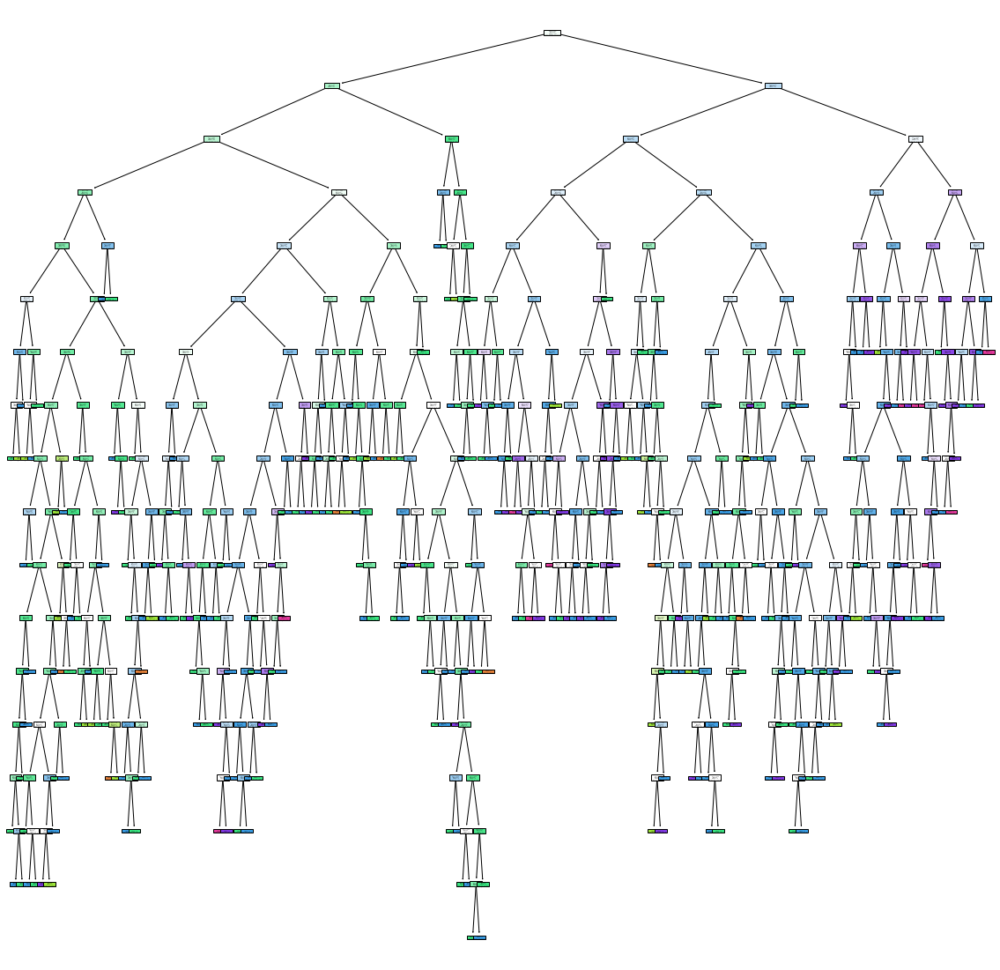

In [18]:
plt.figure(figsize=(20, 20))
tree.plot_tree(dt_model, filled=True)

In [19]:
# df1=df.head(30)
# df1=df.head(120)
df1=df.head(500)
# if you increase upto train and test data equal then both graph sinkup

In [20]:
x1=df1.drop(columns='quality')

In [21]:
y1=df1.quality

In [22]:
dt_model1=DecisionTreeClassifier()
dt_model1.fit(x1, y1)

DecisionTreeClassifier()

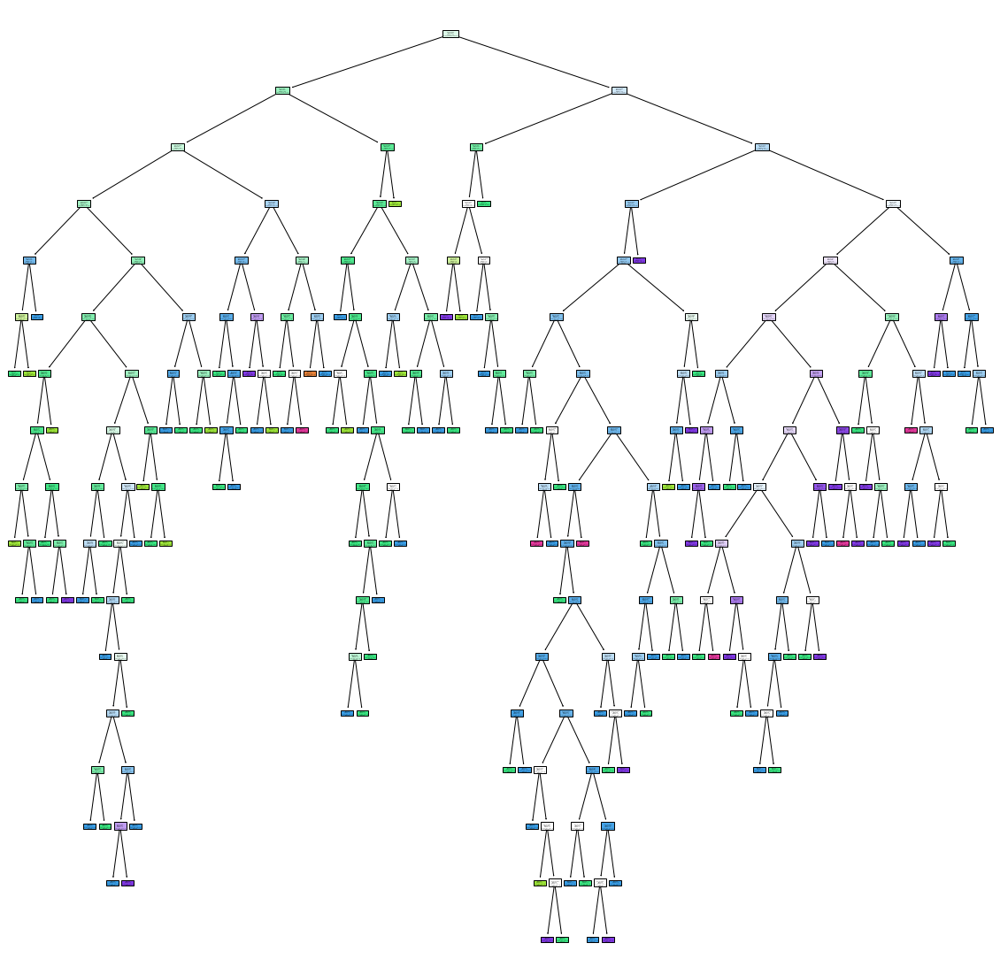

In [23]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled=True, class_names=[str(i) for i in set(y1)])
plt.savefig('dt_model_1')

In [24]:
set(y1)

{3, 4, 5, 6, 7, 8}

In [25]:
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
495,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8
496,7.8,0.52,0.25,1.9,0.081,14.0,38.0,0.9984,3.43,0.65,9.0,6
497,7.2,0.34,0.32,2.5,0.090,43.0,113.0,0.9966,3.32,0.79,11.1,5
498,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8


In [26]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 4, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6,
       7, 4, 7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 7, 7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5,
       5, 7, 4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6,

In [27]:
dt_model1.score(x1,y1)

1.0

In [28]:
dt_model1.score(X_test, y_test)

0.5825

In [29]:
path=dt_model1.cost_complexity_pruning_path(x1, y1)

In [30]:
path

{'ccp_alphas': array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
        0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.00261111,
        0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00271329,
        0.00272222, 0.00285714, 0.003     , 0.003     , 0.003     ,
        0.003     , 0.00304762, 0.00305051, 0.00308418, 0.00325   ,
        0.00328205, 0.00333333, 0.00333333, 0.00334032, 0.00336606,
        0.00342857, 0.00343316, 0.0035    , 0.0035    , 0.0036    ,
        0.00363636, 0.00373809, 0.0038    , 0.0038237 , 0.004     ,
        0.00404444, 0.00428571, 0.00428571, 0.00437662, 0.00462338,
        0.00465709, 0.00466667, 0.0048    , 0.00487179, 0.00504242,
        0.00508235, 0.00509091, 0.00510606, 0.00516667, 0.00568485,
        0.00589394, 0.00656364, 0.

In [31]:
ccp_alpha=path.ccp_alphas

In [32]:
ccp_alpha

array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
       0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.00261111,
       0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00271329,
       0.00272222, 0.00285714, 0.003     , 0.003     , 0.003     ,
       0.003     , 0.00304762, 0.00305051, 0.00308418, 0.00325   ,
       0.00328205, 0.00333333, 0.00333333, 0.00334032, 0.00336606,
       0.00342857, 0.00343316, 0.0035    , 0.0035    , 0.0036    ,
       0.00363636, 0.00373809, 0.0038    , 0.0038237 , 0.004     ,
       0.00404444, 0.00428571, 0.00428571, 0.00437662, 0.00462338,
       0.00465709, 0.00466667, 0.0048    , 0.00487179, 0.00504242,
       0.00508235, 0.00509091, 0.00510606, 0.00516667, 0.00568485,
       0.00589394, 0.00656364, 0.00671079, 0.0067591 , 0.00688

In [33]:
dt_model2=[]
for ccp in ccp_alpha:
    dt_m=DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)

In [34]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.0018500000000000005),
 DecisionTreeClassifier(ccp_alpha=0.001866666666666667),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.0026276923076923083),
 Deci

In [35]:
train_score= [i.score(x1,y1) for i in dt_model2]
    

In [36]:
test_score =[i.score(X_test, y_test) for i in dt_model2]

In [37]:
train_score

[1.0,
 0.998,
 0.994,
 0.994,
 0.992,
 0.99,
 0.99,
 0.986,
 0.962,
 0.96,
 0.962,
 0.96,
 0.964,
 0.962,
 0.96,
 0.96,
 0.96,
 0.962,
 0.958,
 0.954,
 0.946,
 0.928,
 0.93,
 0.928,
 0.93,
 0.93,
 0.93,
 0.928,
 0.93,
 0.93,
 0.926,
 0.924,
 0.914,
 0.918,
 0.916,
 0.916,
 0.918,
 0.914,
 0.908,
 0.908,
 0.904,
 0.9,
 0.896,
 0.898,
 0.896,
 0.892,
 0.89,
 0.882,
 0.884,
 0.88,
 0.876,
 0.868,
 0.866,
 0.862,
 0.854,
 0.858,
 0.858,
 0.856,
 0.842,
 0.848,
 0.834,
 0.818,
 0.824,
 0.824,
 0.804,
 0.802,
 0.794,
 0.79,
 0.786,
 0.784,
 0.78,
 0.776,
 0.776,
 0.772,
 0.768,
 0.762,
 0.758,
 0.742,
 0.728,
 0.718,
 0.698,
 0.69,
 0.682,
 0.676,
 0.676,
 0.636,
 0.596,
 0.596,
 0.596,
 0.558,
 0.478]

In [38]:
test_score

[0.6025,
 0.5875,
 0.6075,
 0.59,
 0.585,
 0.6225,
 0.585,
 0.5825,
 0.58,
 0.605,
 0.595,
 0.6,
 0.5775,
 0.5825,
 0.5725,
 0.5925,
 0.595,
 0.5775,
 0.5825,
 0.6075,
 0.605,
 0.5925,
 0.595,
 0.5825,
 0.59,
 0.6,
 0.5975,
 0.605,
 0.61,
 0.5875,
 0.6,
 0.6075,
 0.6,
 0.5925,
 0.595,
 0.5975,
 0.5975,
 0.6025,
 0.61,
 0.6,
 0.5875,
 0.61,
 0.6025,
 0.615,
 0.5975,
 0.61,
 0.605,
 0.605,
 0.605,
 0.605,
 0.6125,
 0.605,
 0.6,
 0.6125,
 0.605,
 0.615,
 0.6125,
 0.61,
 0.605,
 0.61,
 0.61,
 0.6075,
 0.61,
 0.61,
 0.615,
 0.6175,
 0.61,
 0.6075,
 0.605,
 0.6,
 0.5925,
 0.59,
 0.5875,
 0.5825,
 0.5825,
 0.5925,
 0.5875,
 0.585,
 0.5825,
 0.5825,
 0.56,
 0.5725,
 0.5625,
 0.555,
 0.555,
 0.54,
 0.5775,
 0.5775,
 0.5775,
 0.545,
 0.4225]

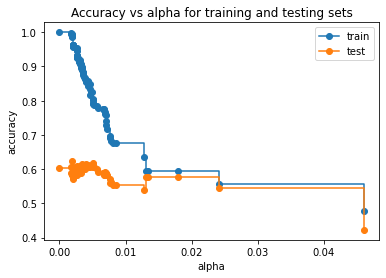

In [39]:
fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train", drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label='test', drawstyle="steps-post")
ax.legend()
plt.show()


In [40]:
dt_model_ccp= DecisionTreeClassifier(random_state=0, ccp_alpha=.014)
dt_model_ccp.fit(x1, y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(558.0, 906.0, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(279.0, 543.6, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(139.5, 181.19999999999993, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(418.5, 181.19999999999993, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(837.0, 543.6, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(697.5, 181.19999999999993, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(976.5, 181.19999999999993, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

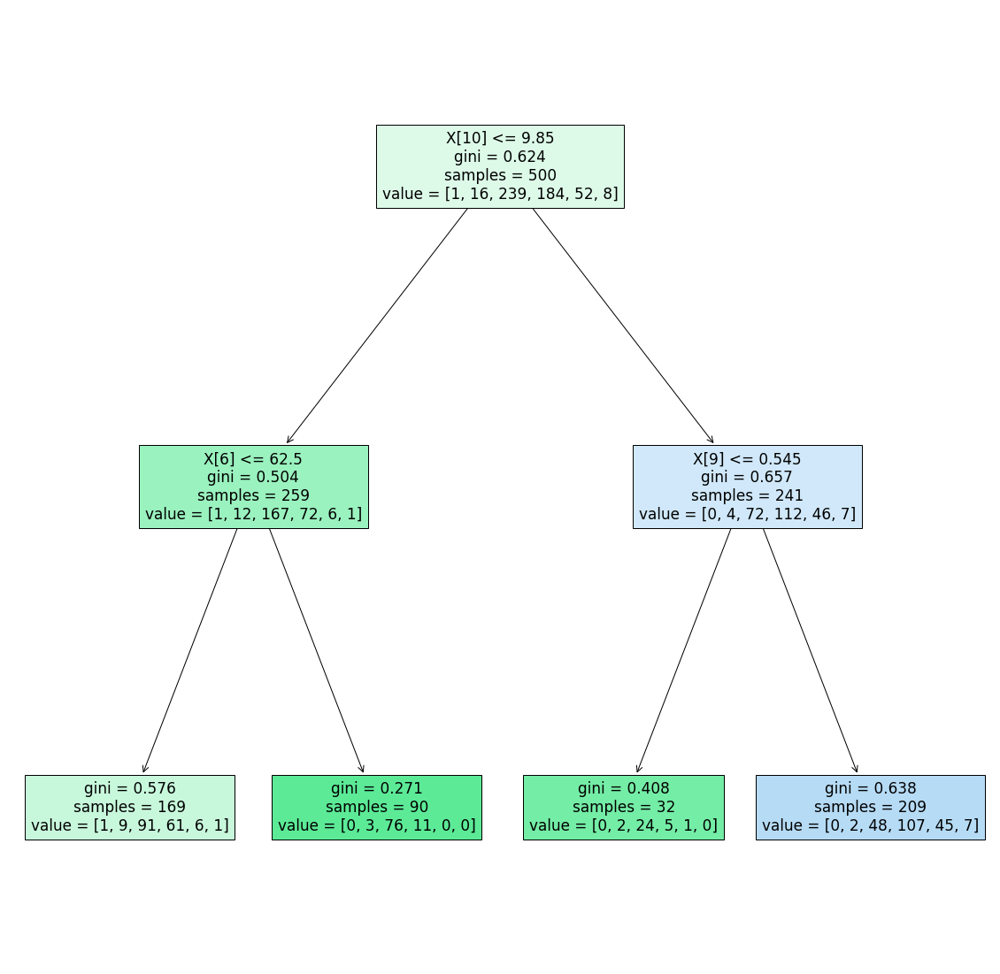

In [41]:
#chopup the branch by pruning method
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp, filled=True)

In [42]:
dt_model_ccp.score(x1,y1)

0.596

In [43]:
dt_model_ccp.score(X_test, y_test)

0.5775

In [44]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [45]:
grid_param={
    'criterion':['gini', 'entropy'], 'splitter':['best', 'random'], 'max_depth':range(2,40,1),'min_samples_split':range(2,10,1), 'min_samples_leaf':range(1,10,1)
    
}

In [46]:
grid_ccp=GridSearchCV(estimator=dt_model_ccp, param_grid=grid_param, cv=5, n_jobs=-1)

In [47]:
#grid_ccp.fit(x1, y1)

In [48]:
#grid_ccp.best_params_

In [49]:
dt_CCP_new=DecisionTreeClassifier(criterion= 'entropy',
 max_depth= 15,
 min_samples_leaf= 2,
 min_samples_split= 2,
 splitter= 'random')

In [50]:
dt_CCP_new.fit(x1,y1)

DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_leaf=2,
                       splitter='random')

In [51]:
dt_CCP_new.score(x1,y1)

0.884

In [52]:
dt_CCP_new.score(X_test, y_test)

0.5825

In [53]:
pred=dt_CCP_new.predict(X_train)

In [54]:
confusion_matrix(y_train, pred)

array([[  0,   1,   2,   5,   0,   0],
       [  2,   8,  15,  10,   0,   0],
       [  6,  15, 361, 124,   5,   1],
       [  0,  11, 180, 263,  20,   3],
       [  0,   1,  30,  61,  41,  20],
       [  0,   0,   1,   8,   1,   4]], dtype=int64)

In [55]:
x=df.drop(columns='quality')

In [56]:
y=df.quality

In [57]:
from sklearn.ensemble import BaggingClassifier

In [58]:
x_train, x_test, y_train, y_test=train_test_split(x,y, random_state=0)

In [71]:
bag_dt=BaggingClassifier(DecisionTreeClassifier(), n_estimators=100)

In [72]:
bag_dt.fit(x_train, y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=100)

In [73]:
bag_dt.predict(x_test)

array([6, 5, 7, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6, 4, 5, 7, 7, 5, 5, 6, 6, 5,
       6, 7, 5, 5, 5, 7, 5, 6, 6, 6, 6, 5, 7, 7, 5, 6, 6, 6, 5, 6, 6, 7,
       6, 5, 5, 6, 5, 6, 5, 5, 6, 6, 6, 5, 5, 5, 7, 5, 5, 6, 6, 6, 5, 6,
       5, 5, 7, 6, 6, 5, 5, 5, 6, 6, 5, 5, 5, 7, 6, 5, 6, 6, 6, 5, 6, 5,
       5, 5, 5, 6, 6, 5, 7, 6, 6, 5, 5, 5, 7, 6, 6, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 8, 5, 6, 6, 5, 7, 6, 6, 5, 6, 5, 5, 6, 7, 5, 5, 6, 7, 5, 5,
       6, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5, 5, 5, 6, 8, 6, 5, 5, 6, 7, 5, 6,
       6, 6, 6, 6, 6, 6, 6, 6, 7, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 7, 5, 6,
       7, 7, 7, 5, 5, 7, 6, 6, 7, 5, 6, 6, 5, 6, 6, 5, 5, 6, 5, 5, 5, 5,
       6, 5, 5, 6, 6, 6, 5, 5, 5, 6, 7, 6, 6, 6, 5, 7, 5, 6, 5, 7, 6, 5,
       5, 6, 6, 5, 6, 6, 6, 6, 6, 5, 5, 6, 5, 5, 6, 6, 6, 7, 7, 6, 5, 6,
       5, 5, 6, 5, 5, 5, 5, 7, 5, 5, 5, 5, 5, 6, 5, 5, 5, 7, 5, 6, 5, 6,
       5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 6, 6, 6, 6, 6, 7, 5, 7, 5, 6, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 6, 5, 6, 6, 6, 5, 5, 6,

In [74]:
bag_dt.base_estimator_

DecisionTreeClassifier()

In [64]:
bag_dt.classes_

array([3, 4, 5, 6, 7, 8], dtype=int64)

In [65]:
bag_dt.estimator_params

()

In [66]:
from sklearn.neighbors import KNeighborsClassifier

In [87]:
bag_knn=BaggingClassifier(KNeighborsClassifier(6), n_estimators=100)

In [88]:
bag_knn.fit(x_train, y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6),
                  n_estimators=100)

In [89]:
bag_knn.predict(x_test)

array([5, 6, 7, 6, 6, 6, 6, 6, 6, 6, 5, 6, 5, 5, 6, 6, 7, 6, 6, 6, 6, 6,
       6, 5, 6, 5, 5, 6, 5, 6, 6, 6, 6, 6, 7, 7, 5, 6, 6, 6, 6, 7, 6, 5,
       6, 6, 5, 6, 5, 5, 6, 5, 6, 6, 5, 5, 5, 5, 7, 5, 5, 6, 6, 5, 6, 5,
       5, 7, 8, 7, 5, 5, 6, 5, 6, 6, 5, 5, 5, 6, 5, 5, 5, 6, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 5, 7, 6, 6, 6, 5, 6, 5, 6, 6, 5,
       6, 5, 6, 6, 5, 6, 5, 7, 7, 6, 5, 7, 6, 5, 7, 5, 5, 5, 5, 6, 5, 5,
       6, 5, 6, 5, 6, 5, 6, 5, 6, 6, 5, 6, 5, 6, 6, 7, 6, 6, 5, 5, 6, 6,
       5, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 5, 6, 5, 6, 5, 5, 7, 6, 7, 7, 5,
       7, 7, 7, 5, 5, 6, 6, 6, 7, 5, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 6, 6, 6, 6, 5, 5, 6, 6, 6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5,
       5, 5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 7, 6, 7, 6, 7, 6, 6, 5,
       6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 5, 6, 6, 5,
       5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 6, 7, 6, 6, 7, 6, 6, 5, 5, 5, 5,
       5, 5, 6, 6, 6, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6,

In [90]:
from sklearn.ensemble import RandomForestClassifier

In [103]:
rf=RandomForestClassifier(n_estimators=5)

In [104]:
rf.fit(x_train, y_train)

RandomForestClassifier(n_estimators=5)

In [105]:
rf.score(x_test, y_test)

0.6375

In [106]:
bag_dt.score(x_test, y_test)

0.6675

In [107]:
bag_knn.score(x_test, y_test)

0.51

In [108]:
rf.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=139736981),
 DecisionTreeClassifier(max_features='auto', random_state=1374187563),
 DecisionTreeClassifier(max_features='auto', random_state=2016995018),
 DecisionTreeClassifier(max_features='auto', random_state=287212269),
 DecisionTreeClassifier(max_features='auto', random_state=1513665288)]

In [109]:
rf.estimators_[0]

DecisionTreeClassifier(max_features='auto', random_state=139736981)

[Text(637.3828460460401, 1055.2235294117647, 'X[10] <= 10.35\ngini = 0.65\nsamples = 756\nvalue = [9, 31, 496, 471, 186, 6]'),
 Text(409.8623643249046, 991.2705882352941, 'X[2] <= 0.505\ngini = 0.534\nsamples = 412\nvalue = [5, 16, 392, 209, 31, 0]'),
 Text(273.43846910782446, 927.3176470588236, 'X[9] <= 0.585\ngini = 0.515\nsamples = 373\nvalue = [5, 16, 369, 177, 22, 0]'),
 Text(105.42366412213741, 863.364705882353, 'X[5] <= 19.5\ngini = 0.396\nsamples = 184\nvalue = [3, 11, 220, 58, 1, 0]'),
 Text(73.47709923664122, 799.4117647058824, 'X[8] <= 3.415\ngini = 0.473\nsamples = 117\nvalue = [2, 9, 122, 46, 1, 0]'),
 Text(64.95801526717558, 735.4588235294118, 'X[2] <= 0.385\ngini = 0.504\nsamples = 104\nvalue = [2, 8, 101, 46, 1, 0]'),
 Text(60.69847328244275, 671.5058823529412, 'X[0] <= 6.75\ngini = 0.526\nsamples = 95\nvalue = [2, 8, 89, 46, 1, 0]'),
 Text(56.43893129770993, 607.5529411764707, 'gini = 0.0\nsamples = 8\nvalue = [0, 0, 11, 0, 0, 0]'),
 Text(64.95801526717558, 607.5529411

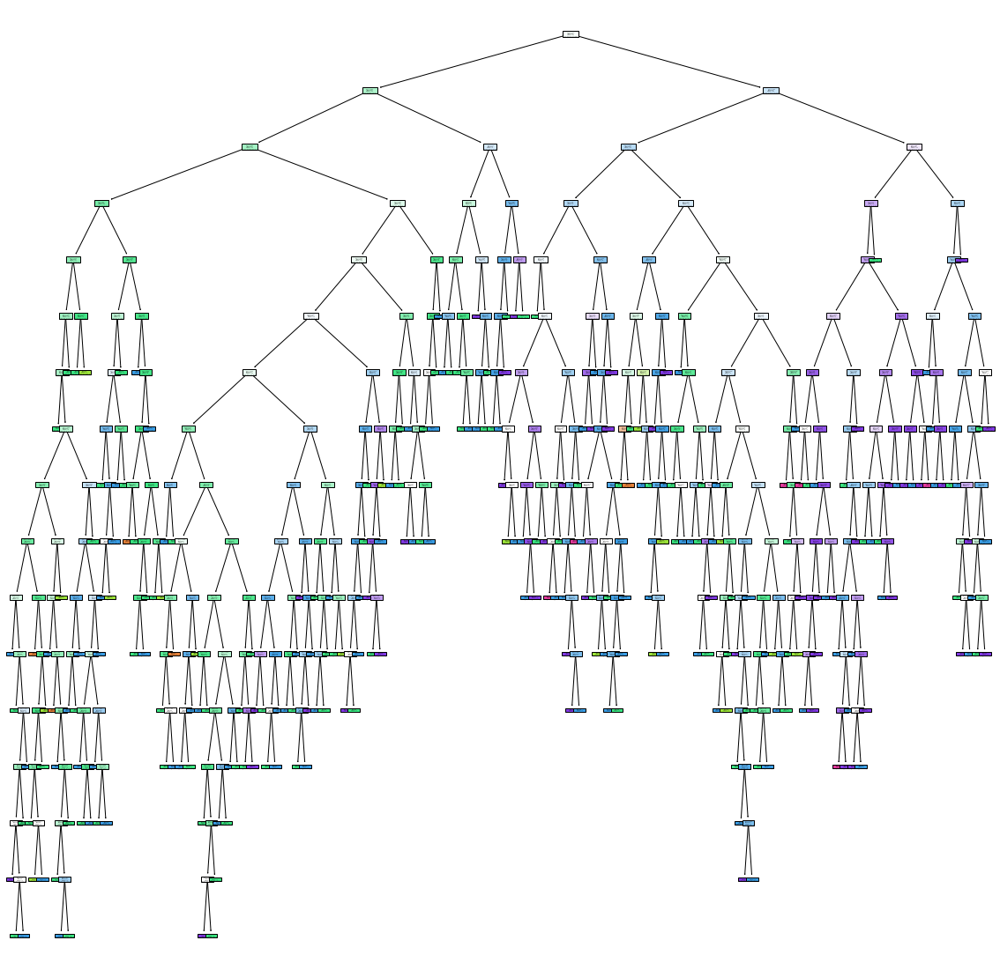

In [112]:
plt.figure(figsize=(20, 20))
tree.plot_tree(rf.estimators_[0], filled=True)

[Text(533.1666560590631, 1064.55, 'X[10] <= 10.35\ngini = 0.659\nsamples = 769\nvalue = [5, 54, 495, 458, 182, 5]'),
 Text(180.4656950101833, 1019.25, 'X[1] <= 0.365\ngini = 0.546\nsamples = 414\nvalue = [4, 28, 388, 207, 27, 1]'),
 Text(31.252545824847253, 973.95, 'X[7] <= 0.996\ngini = 0.556\nsamples = 56\nvalue = [0, 1, 23, 55, 11, 1]'),
 Text(13.637474541751528, 928.6500000000001, 'X[0] <= 6.25\ngini = 0.298\nsamples = 4\nvalue = [0, 0, 9, 0, 2, 0]'),
 Text(9.091649694501019, 883.35, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 9, 0, 0, 0]'),
 Text(18.183299389002038, 883.35, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 0, 2, 0]'),
 Text(48.867617107942976, 928.6500000000001, 'X[3] <= 2.15\ngini = 0.484\nsamples = 52\nvalue = [0, 1, 14, 55, 9, 1]'),
 Text(27.274949083503056, 883.35, 'X[0] <= 11.7\ngini = 0.268\nsamples = 28\nvalue = [0, 0, 1, 39, 5, 1]'),
 Text(22.729124236252545, 838.05, 'X[2] <= 0.345\ngini = 0.136\nsamples = 26\nvalue = [0, 0, 1, 39, 1, 1]'),
 Text(18.183299389002038

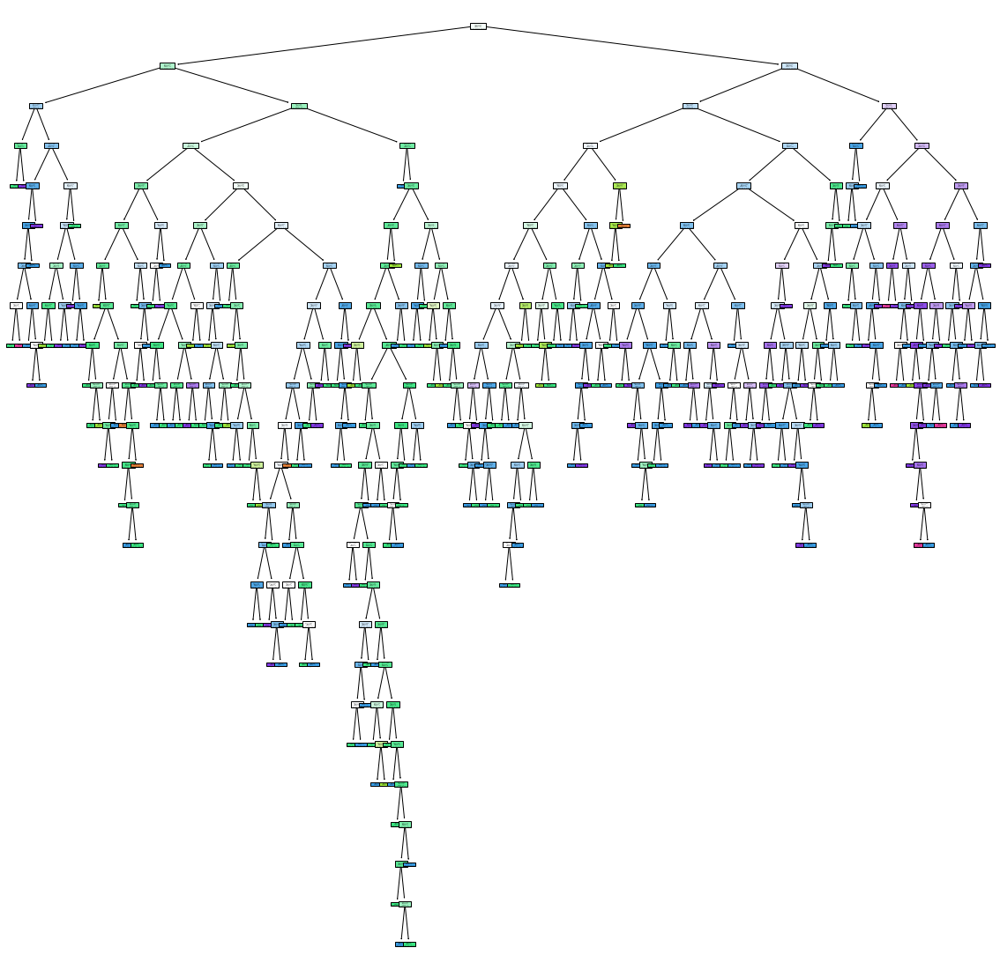

In [113]:
plt.figure(figsize=(20, 20))
tree.plot_tree(rf.estimators_[1], filled=True)

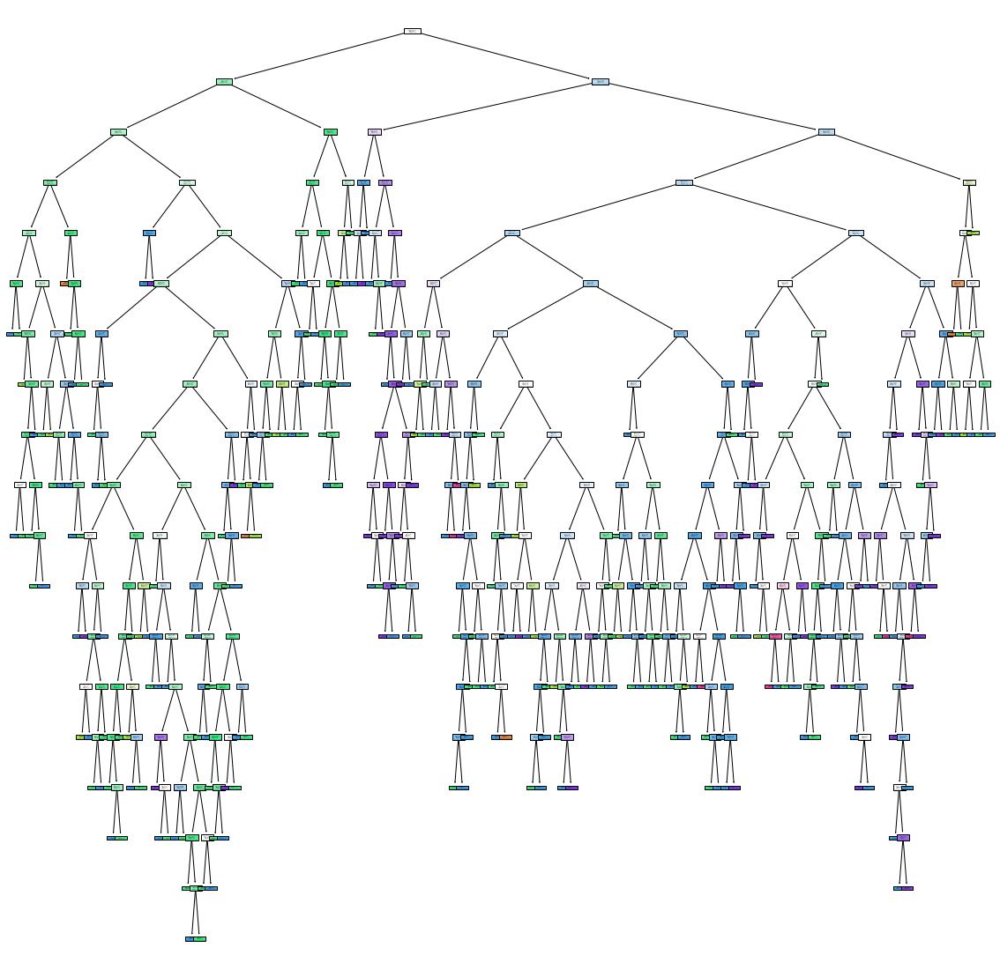

In [117]:
plt.figure(figsize=(20,20))
for i in range(len(rf.estimators_)-1):
    tree.plot_tree(rf.estimators_[i], filled=True)

In [116]:
len(rf.estimators_)

5

In [137]:
grid_param={
    'n_estimators': [5, 50, 100, 120, 150], 
    'criterion': ['gini', 'entropy'],
    'max_depth': range(10), 
    'min_samples_leaf': range(10)
    
}

In [143]:
rf=RandomForestClassifier(n_estimators=5)

In [144]:
grid_search_rf=GridSearchCV(param_grid=grid_param, cv=10, n_jobs=10, verbose=1, estimator=rf)

In [140]:
grid_search_rf.fit(x_train, y_train)

Fitting 10 folds for each of 1000 candidates, totalling 10000 fits


C:\Users\itnes\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(("The least populated class in y has only %d"
C:\Users\itnes\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan 0.

GridSearchCV(cv=10, estimator=RandomForestClassifier(n_estimators=5), n_jobs=10,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [5, 50, 100, 120, 150]},
             verbose=1)

In [141]:
grid_search_rf.best_params_

{'criterion': 'entropy',
 'max_depth': 9,
 'min_samples_leaf': 1,
 'n_estimators': 150}

In [146]:
rf_new=RandomForestClassifier(criterion='entropy',
 max_depth= 9,
 min_samples_leaf= 1,
 n_estimators= 150)

In [147]:
rf_new.fit(x_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, n_estimators=150)

In [149]:
rf_new.score(x_test, y_test)

0.665

In [153]:
# when i do the hyper parameter , It is not neccesary to increase the accuzry but my stability is increase
# model accuracy doesn't matter , how accurate model instead of stability of model is matter 
# Model fitting is matter, how model is over and under fitting model, it matter a lots

[Text(551.9899878640776, 1032.8400000000001, 'X[4] <= 0.076\nentropy = 1.746\nsamples = 757\nvalue = [7, 43, 505, 460, 170, 14]'),
 Text(231.51243932038835, 924.1200000000001, 'X[10] <= 10.525\nentropy = 1.87\nsamples = 305\nvalue = [0, 22, 158, 186, 114, 11]'),
 Text(87.35679611650485, 815.4000000000001, 'X[1] <= 0.335\nentropy = 1.52\nsamples = 146\nvalue = [0, 11, 131, 68, 16, 2]'),
 Text(32.504854368932044, 706.6800000000001, 'X[9] <= 0.63\nentropy = 1.714\nsamples = 24\nvalue = [0, 0, 10, 18, 8, 2]'),
 Text(10.83495145631068, 597.96, 'X[2] <= 0.24\nentropy = 0.94\nsamples = 8\nvalue = [0, 0, 9, 5, 0, 0]'),
 Text(5.41747572815534, 489.24, 'entropy = 0.0\nsamples = 2\nvalue = [0, 0, 5, 0, 0, 0]'),
 Text(16.252427184466022, 489.24, 'X[5] <= 14.5\nentropy = 0.991\nsamples = 6\nvalue = [0, 0, 4, 5, 0, 0]'),
 Text(10.83495145631068, 380.5200000000001, 'X[7] <= 0.997\nentropy = 0.722\nsamples = 3\nvalue = [0, 0, 4, 1, 0, 0]'),
 Text(5.41747572815534, 271.80000000000007, 'entropy = 0.0\ns

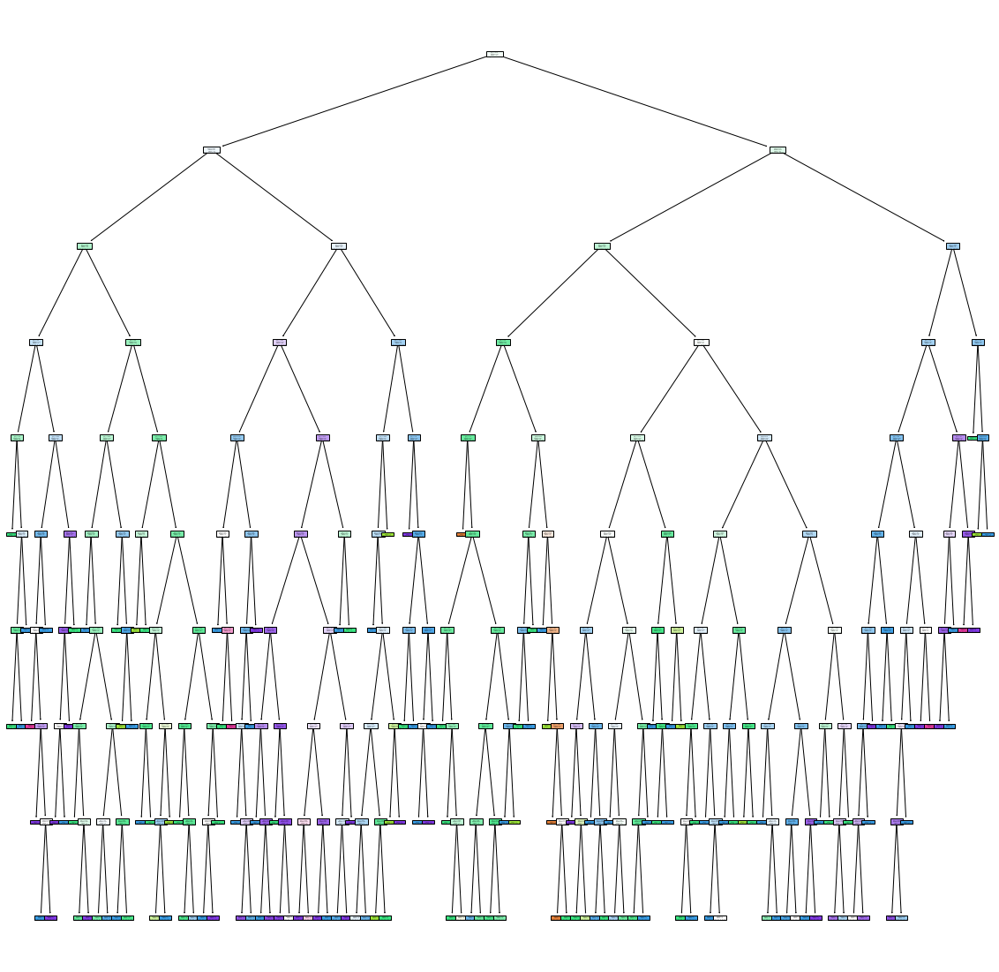

In [152]:
plt.figure(figsize=(20, 20))
tree.plot_tree(rf_new.estimators_[0], filled=True)